### Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime

In [2]:
df = pd.read_csv('../02_Daten/Simulation-Dichteprüfung/simulation-st5.csv', sep=';')

C:\Users\pauls\AppData\Roaming\Python\Python38\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (1,7,10,14) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
# Richtige Zeit für alle Einträge
df['time'] = [datetime.utcfromtimestamp(x/1000) for x in df['time']]
df.head()

,time,configuration_label,configuration_label_druck_change_5,configuration_label_druck_change_6,configuration_label_druck_change_7,druck,handaktiv,identnummer,iomaster,leck,maintenance_label,maintenance_label_cleaning,messenaktiv,repair_label,rework_label,rework_label_assembly_error,status
0,2021-10-24 22:00:00,NaN,False,False,False,5.362381,False,NaN,False,0.0,NaN,False,False,NaN,NaN,False,0.0
1,2021-10-24 22:00:01,NaN,False,False,False,4.604942,False,NaN,False,0.0,NaN,False,False,NaN,NaN,False,0.0
2,2021-10-24 22:00:02,NaN,False,False,False,6.139246,False,NaN,False,0.0,NaN,False,False,NaN,NaN,False,0.0
3,2021-10-24 22:00:03,NaN,False,False,False,5.217539,False,NaN,False,0.0,NaN,False,False,NaN,NaN,False,0.0
4,2021-10-24 22:00:04,NaN,False,False,False,4.224132,False,NaN,False,0.0,NaN,False,False,NaN,NaN,False,0.0


In [4]:
df.tail()

,time,configuration_label,configuration_label_druck_change_5,configuration_label_druck_change_6,configuration_label_druck_change_7,druck,handaktiv,identnummer,iomaster,leck,maintenance_label,maintenance_label_cleaning,messenaktiv,repair_label,rework_label,rework_label_assembly_error,status
1455419,2021-11-10 22:59:56,NaN,False,False,False,5.547973,False,f09e9266-7de4-4607-877d-9b52f9c5b7a5,False,0.0,NaN,False,True,NaN,NaN,False,3.0
1455420,2021-11-10 22:59:57,NaN,False,False,False,6.251326,False,f09e9266-7de4-4607-877d-9b52f9c5b7a5,False,0.0,NaN,False,True,NaN,NaN,False,3.0
1455421,2021-11-10 22:59:58,NaN,False,False,False,5.337404,False,f09e9266-7de4-4607-877d-9b52f9c5b7a5,False,0.0,NaN,False,True,NaN,NaN,False,3.0
1455422,2021-11-10 22:59:59,NaN,False,False,False,6.055028,False,f09e9266-7de4-4607-877d-9b52f9c5b7a5,False,0.0,NaN,False,True,NaN,NaN,False,3.0
1455423,2021-11-10 23:00:00,NaN,False,False,False,6.846121,False,f09e9266-7de4-4607-877d-9b52f9c5b7a5,False,0.0,NaN,False,True,NaN,NaN,False,3.0


In [5]:
# insgesamt 1.455.424 Einträge
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1455424 entries, 0 to 1455423
Data columns (total 17 columns):
 #   Column                              Non-Null Count    Dtype         
---  ------                              --------------    -----         
 0   time                                1455424 non-null  datetime64[ns]
 1   configuration_label                 391 non-null      object        
 2   configuration_label_druck_change_5  1455424 non-null  bool          
 3   configuration_label_druck_change_6  1455424 non-null  bool          
 4   configuration_label_druck_change_7  1455424 non-null  bool          
 5   druck                               1455424 non-null  float64       
 6   handaktiv                           1455424 non-null  bool          
 7   identnummer                         835107 non-null   object        
 8   iomaster                            1455424 non-null  bool          
 9   leck                                1455424 non-null  float64       

In [6]:
# einige fehlenden Werte
df.isnull().sum()

time                                        0
configuration_label                   1455033
configuration_label_druck_change_5          0
configuration_label_druck_change_6          0
configuration_label_druck_change_7          0
druck                                       0
handaktiv                                   0
identnummer                            620317
iomaster                                    0
leck                                        0
maintenance_label                     1454798
maintenance_label_cleaning                  0
messenaktiv                                 0
repair_label                          1455424
rework_label                          1450646
rework_label_assembly_error                 0
status                                      0
dtype: int64

In [7]:
# einfache statistische Werte anzeigen lassen
print(df.describe())

              druck          leck  repair_label        status
count  1.455424e+06  1.455424e+06           0.0  1.455424e+06
mean   5.321954e+00 -5.201378e-02           NaN  1.532063e+00
std    6.866639e-01  3.465143e-01           NaN  1.483657e+00
min    2.661133e+00 -1.670795e+01           NaN  0.000000e+00
25%    4.824836e+00  0.000000e+00           NaN  0.000000e+00
50%    5.266114e+00  0.000000e+00           NaN  3.000000e+00
75%    5.794088e+00  0.000000e+00           NaN  3.000000e+00
max    8.783989e+00  3.862173e-01           NaN  4.000000e+00


In [8]:
for c in df.columns:
    print("---- %s ---" % c)
    print(df[c].value_counts())
    print("----------------------------------")

---- time ---
2021-10-24 22:00:00    1
2021-11-05 07:12:07    1
2021-11-05 07:11:43    1
2021-11-05 07:11:42    1
2021-11-05 07:11:41    1
                      ..
2021-10-30 14:11:35    1
2021-10-30 14:11:34    1
2021-10-30 14:11:33    1
2021-10-30 14:11:32    1
2021-11-10 23:00:00    1
Name: time, Length: 1455424, dtype: int64
----------------------------------
---- configuration_label ---
druck_change_6    252
druck_change_5     76
druck_change_7     63
Name: configuration_label, dtype: int64
----------------------------------
---- configuration_label_druck_change_5 ---
False    1455348
True          76
Name: configuration_label_druck_change_5, dtype: int64
----------------------------------
---- configuration_label_druck_change_6 ---
False    1455172
True         252
Name: configuration_label_druck_change_6, dtype: int64
----------------------------------
---- configuration_label_druck_change_7 ---
False    1455361
True          63
Name: configuration_label_druck_change_7, dtype: i

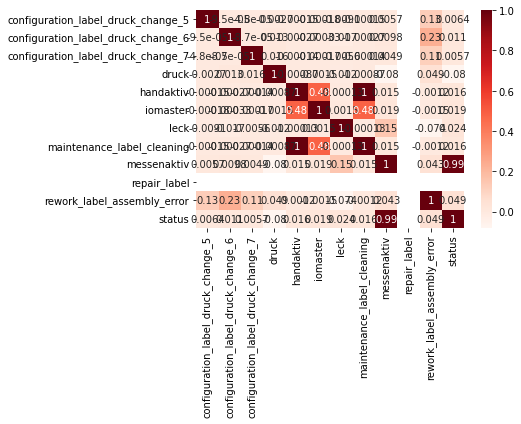

In [9]:
sns.heatmap(df.corr(), annot=True, cmap = 'Reds')
plt.show()

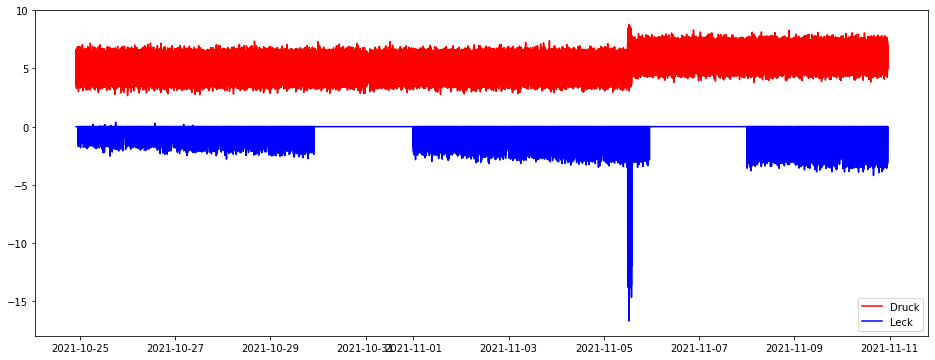

In [10]:
fig, ax = plt.subplots(figsize=(16,6))
ax.plot(df.time, df.druck, color='red', label='Druck')
ax.plot(df.time, df.leck, color='blue', label='Leck')

plt.legend(loc=4)

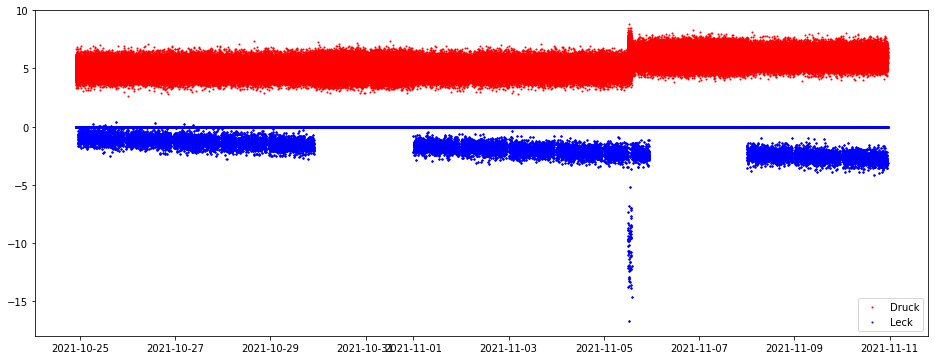

In [11]:
# was bedeutet Messenaktiv? 
sample = df[df.messenaktiv == False]

fig, ax = plt.subplots(figsize=(16,6))
ax.scatter(sample.time, sample.druck, color='red', label='Druck', s=1)
ax.scatter(sample.time, sample.leck, color='blue', label='Leck', s=1)

plt.legend(loc=4)

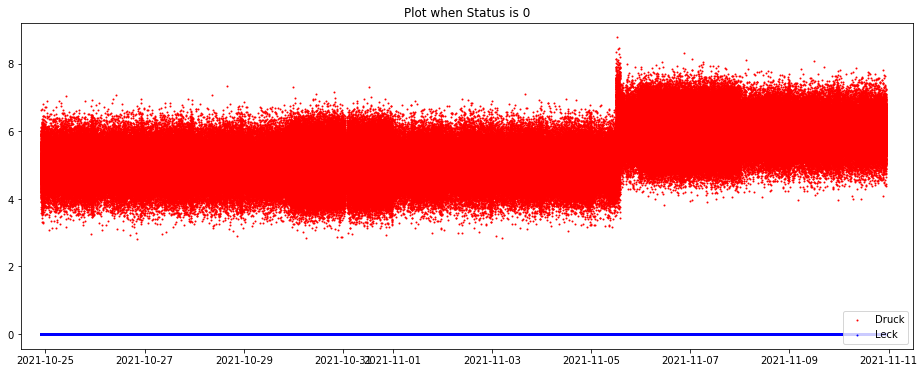

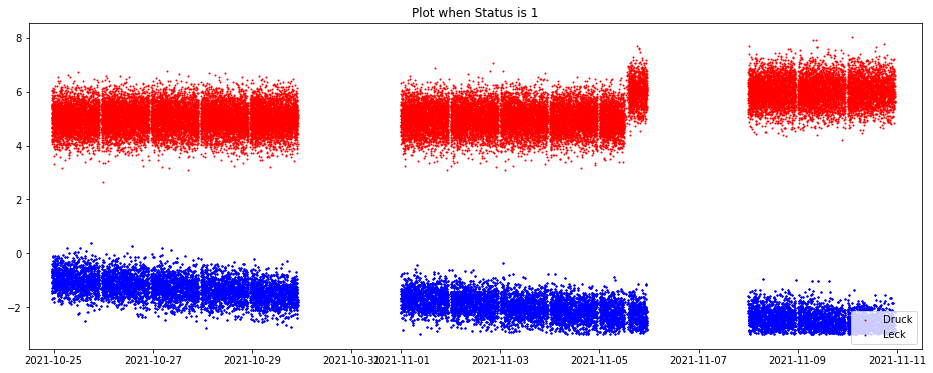

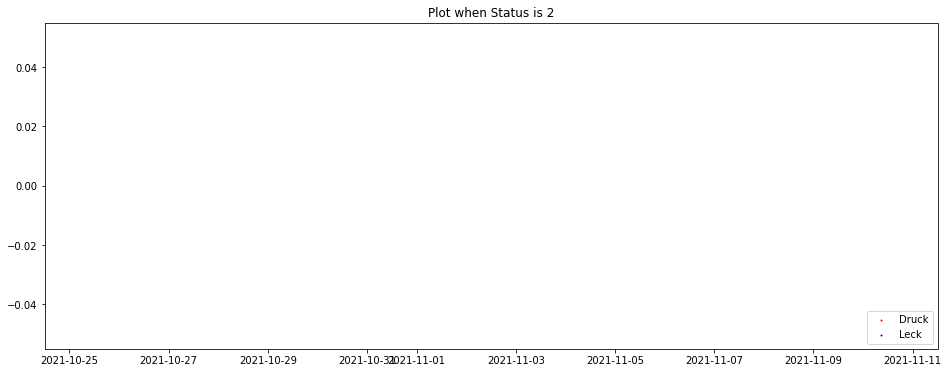

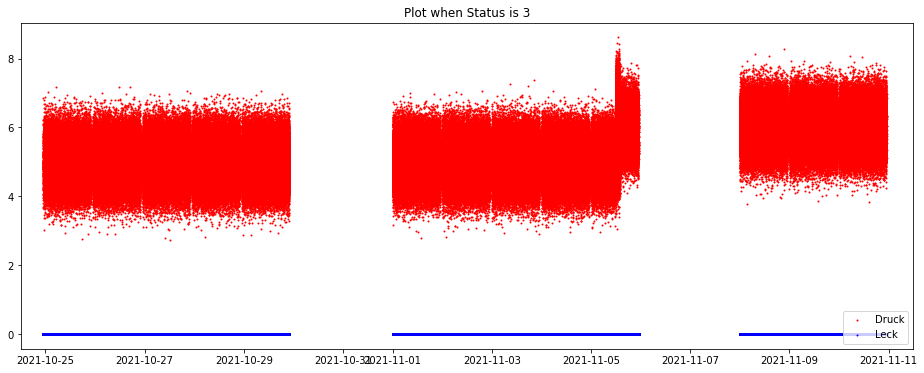

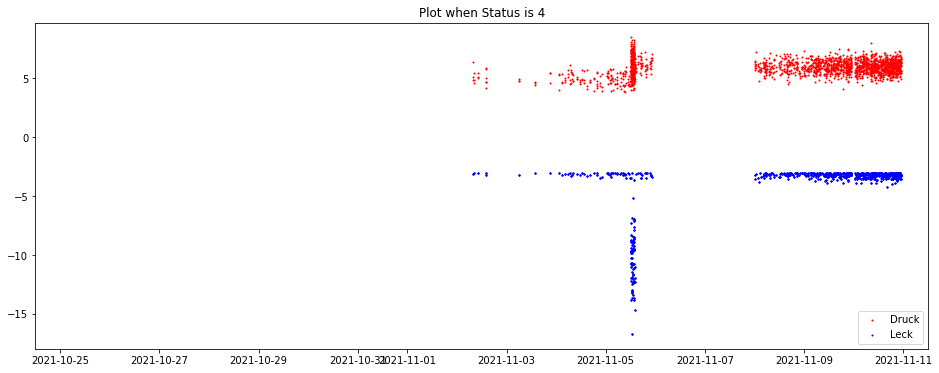

In [12]:
# was bedeuten Status 0 bis 4?
import datetime
for i in range(0,5):
    sample = df[df.status == i]
    fig, ax = plt.subplots(figsize=(16,6))
    ax.scatter(sample.time, sample.druck, color='red', label='Druck', s=1)
    ax.scatter(sample.time, sample.leck, color='blue', label='Leck', s=1)

    ax.set_xlim([datetime.datetime(2021, 10, 24, 12, 0, 0), datetime.datetime(2021, 11, 11, 12, 0, 0)])
    ax.set_title("Plot when Status is " + str(i))
    plt.legend(loc=4)

In [13]:
# erst mal alle Indices, wo Werte über Threshold zu Liste hinzufügen
# Index bzw. Zahl muss aus Liste entfernt werden, wenn vorheriger Wert in einer bestimmten Spanne liegt (bspw. 200)
indices = []
for ind, (time, druck, leck) in enumerate(zip(df.time, df.druck, df.leck)):
    if (druck > 6 or druck < 4 or leck != 0):
        indices.append(ind)

In [14]:
print(indices)

[2, 6, 23, 25, 27, 31, 68, 78, 84, 222, 267, 292, 356, 385, 423, 539, 551, 606, 638, 665, 702, 724, 759, 764, 772, 792, 817, 820, 823, 888, 946, 948, 1041, 1098, 1129, 1141, 1145, 1154, 1162, 1178, 1199, 1202, 1203, 1218, 1223, 1233, 1278, 1295, 1300, 1301, 1336, 1425, 1437, 1452, 1477, 1506, 1547, 1564, 1569, 1588, 1597, 1661, 1681, 1685, 1733, 1737, 1740, 1760, 1845, 1913, 1942, 2065, 2087, 2100, 2110, 2123, 2131, 2170, 2176, 2227, 2231, 2245, 2258, 2269, 2324, 2331, 2342, 2357, 2412, 2442, 2445, 2460, 2463, 2466, 2476, 2528, 2535, 2545, 2558, 2574, 2588, 2601, 2607, 2609, 2630, 2641, 2672, 2675, 2686, 2695, 2715, 2746, 2758, 2807, 2831, 2850, 2851, 2853, 2882, 2886, 2905, 2914, 2915, 2940, 2998, 3014, 3047, 3050, 3068, 3069, 3073, 3080, 3175, 3183, 3192, 3221, 3225, 3234, 3248, 3268, 3294, 3299, 3331, 3385, 3401, 3451, 3487, 3507, 3511, 3569, 3578, 3583, 3640, 3652, 3689, 3690, 3694, 3698, 3716, 3721, 3725, 3750, 3751, 3756, 3758, 3766, 3775, 3776, 3790, 3798, 3799, 3800, 3822, 3825

In [15]:
a = np.array(indices)
print(a)
th = 100
b = np.delete(a, np.argwhere(np.ediff1d(a) <= th) + 1)
print(b)

[      2       6      23 ... 1455420 1455422 1455423]
[     2    222    539   2065  46811  86312 154509 173652 216240 219233
 226371 227312 242524 308176 318267 344040 388570 391290 419612 422253
 423177 428061 428456 428812 430559 431711 432055 433312 435488 435999
 436815 437431 439172 439765 439906 442127 445047 449733 451148 453054
 456011 457781 459204 461705 463115 463562 465050 465580 468088 472111
 473335 476162 477821 482601 483170 484177 487150 492898 493720 501832
 503260 503571 507236 508081 508303 511104 511243 515451 516530 517191
 519288 519687 520938 521678 522727 522933 523203 523654 524600 530238
 530444 535862 539873 541358 541979 546782 548477 548803 549117 550063
 550966 553162 553665 556678 557184 562932 563772 566119 569928 572991
 575705 576085 576408 581872 584602 584989 587849 593733 599482 601025
 636994 639947 686404 687509 687712 752384 771893 772379 774071 856576
 899565 910093 943007]


C:\Users\pauls\AppData\Local\Temp/ipykernel_12076/1491851774.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(16,6))


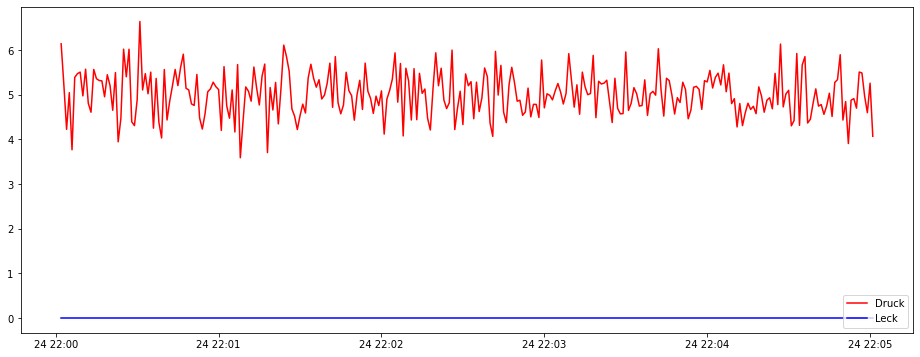

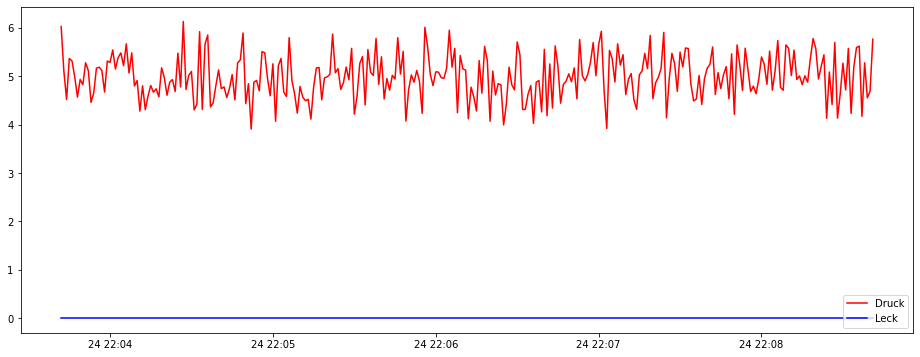

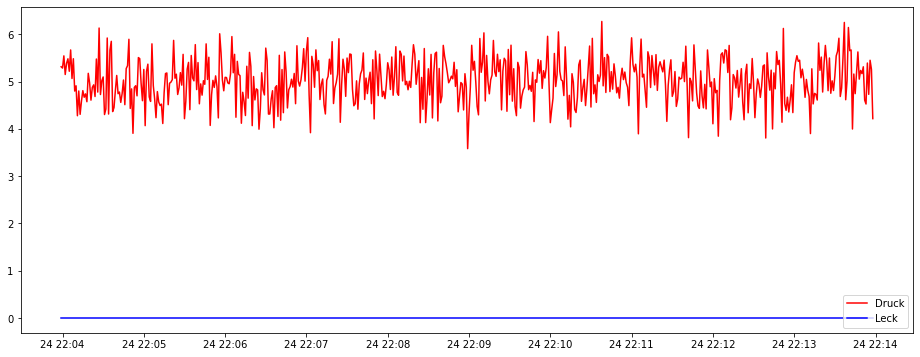

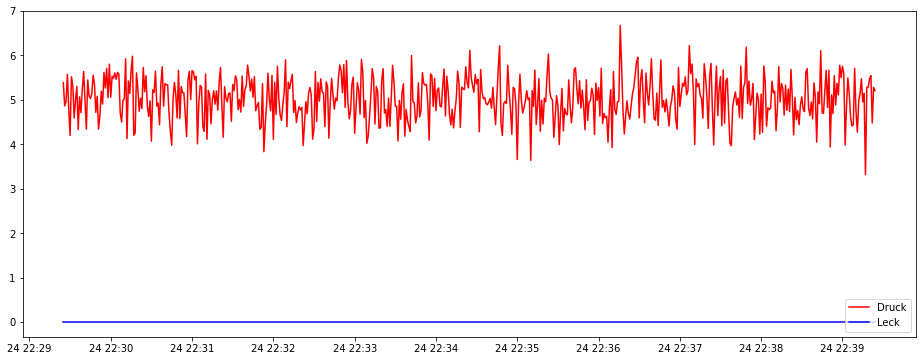

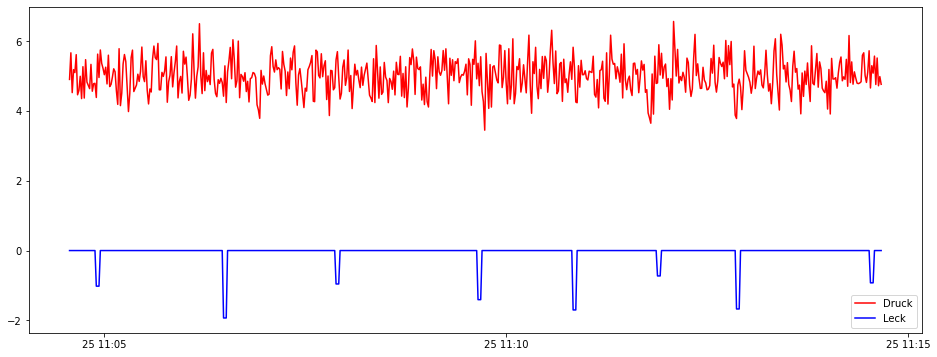

...

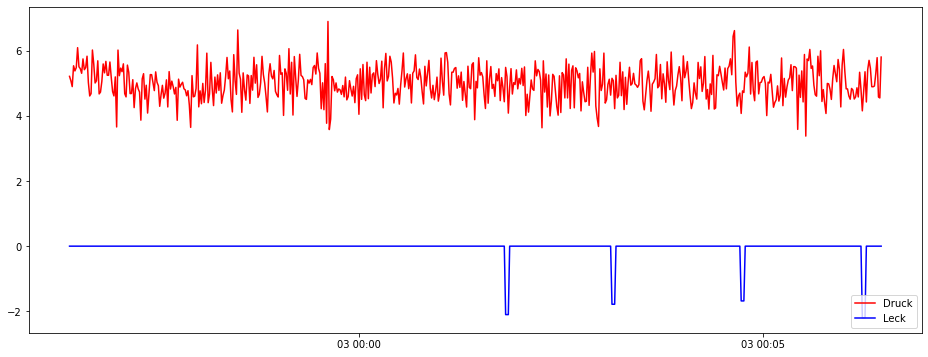

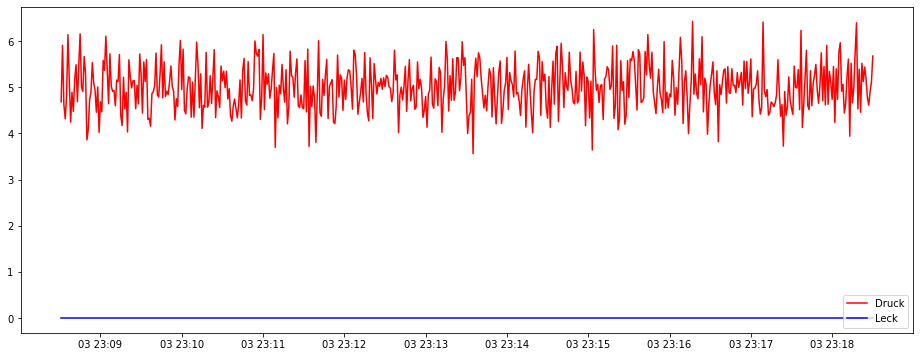

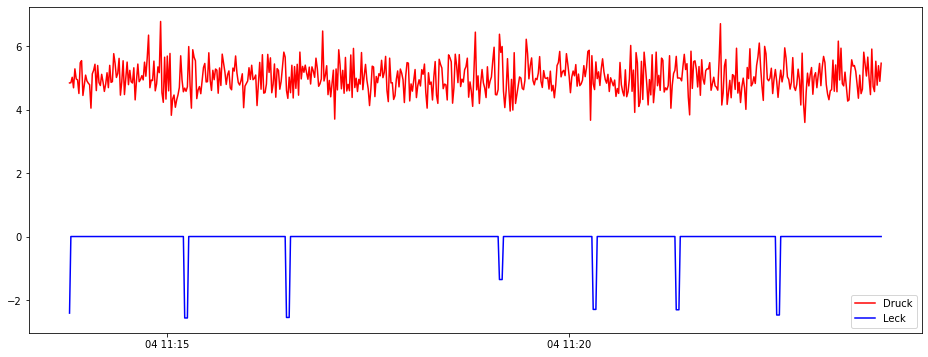

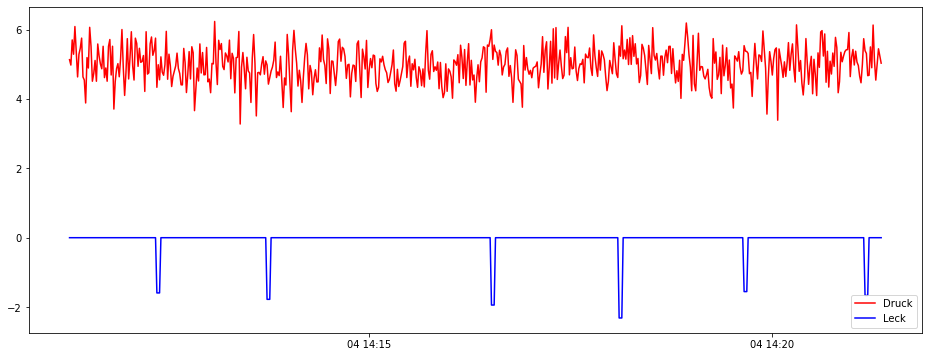

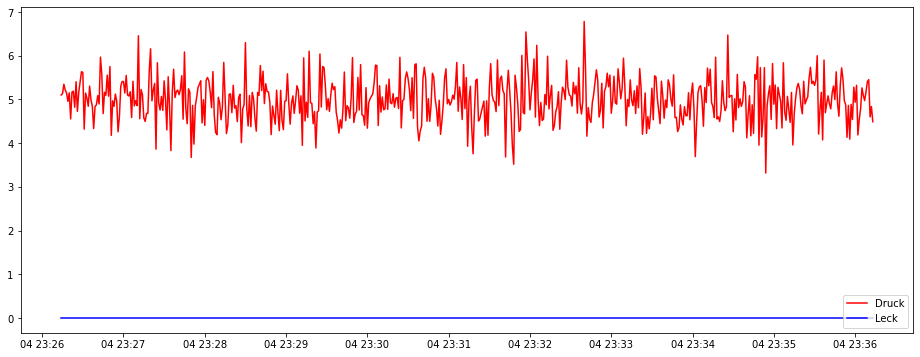

In [16]:
for i in b:
    if (i < 300):
        fig, ax = plt.subplots(figsize=(16,6))
        ax.plot(df.time[i: i + 300], df.druck[i: i + 300], color='red', label='Druck')
        ax.plot(df.time[i: i + 300], df.leck[i: i + 300], color='blue', label='Leck')

        plt.legend(loc=4)

    else:    
        fig, ax = plt.subplots(figsize=(16,6))
        ax.plot(df.time[i - 300: i + 300], df.druck[i - 300: i + 300], color='red', label='Druck')
        ax.plot(df.time[i - 300: i + 300], df.leck[i - 300: i + 300], color='blue', label='Leck')

        plt.legend(loc=4)

In [17]:
# mit Unterscheidung, ob Wert bei Druck oder Leck ungewöhnlich ist
leck_indices = []
druck_indices = []

for ind, (time, druck, leck) in enumerate(zip(df.time, df.druck, df.leck)):
    if (druck > 6.5 or druck < 3.5):
        druck_indices.append(ind)
    if (leck < -3.8):
        leck_indices.append(ind)

In [18]:
l = np.array(leck_indices)
th = 500
leck_short = np.delete(l, np.argwhere(np.ediff1d(l) <= th) + 1)

In [19]:
d = np.array(druck_indices)
druck_short = np.delete(d, np.argwhere(np.ediff1d(d) <= th) + 1)

In [20]:
len(leck_short)

10

In [21]:
len(druck_short)

696

In [34]:
len(b)

123

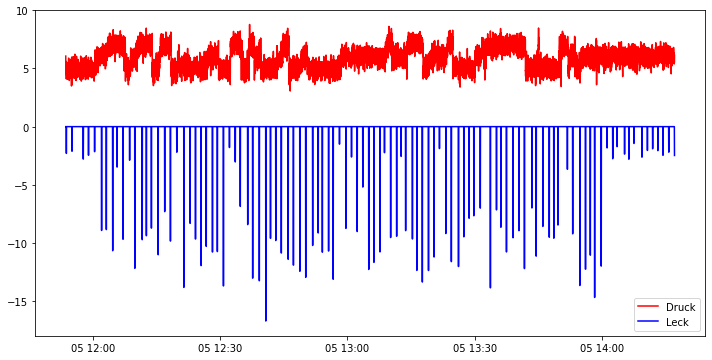

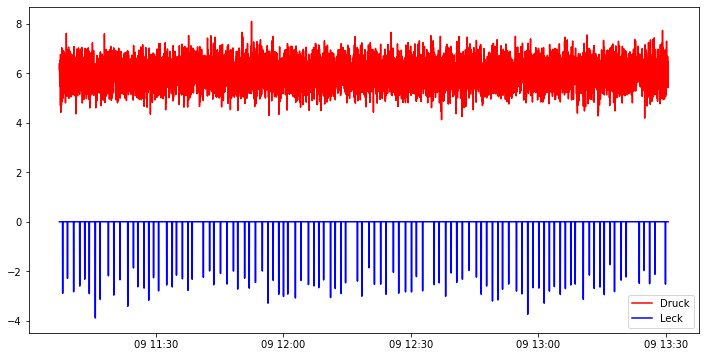

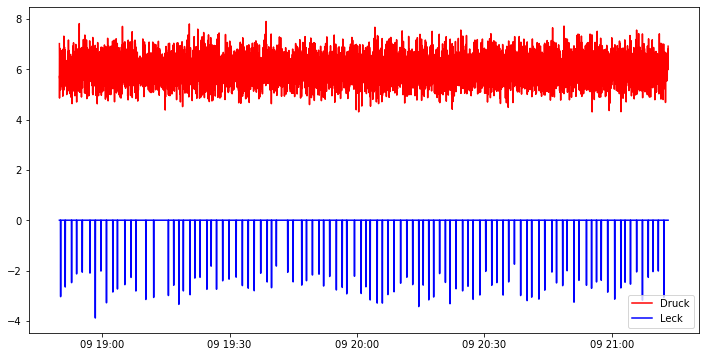

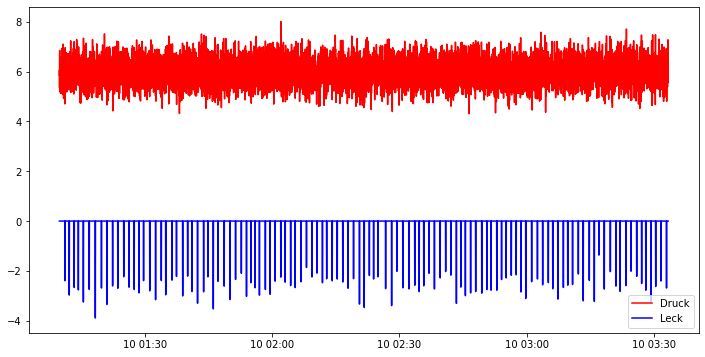

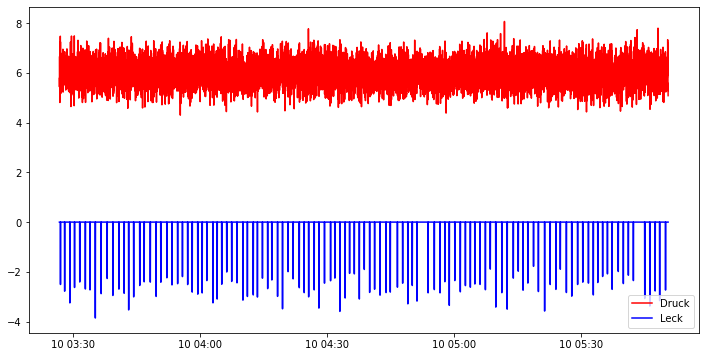

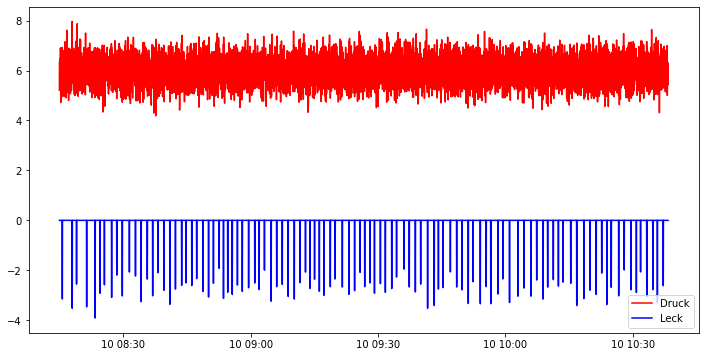

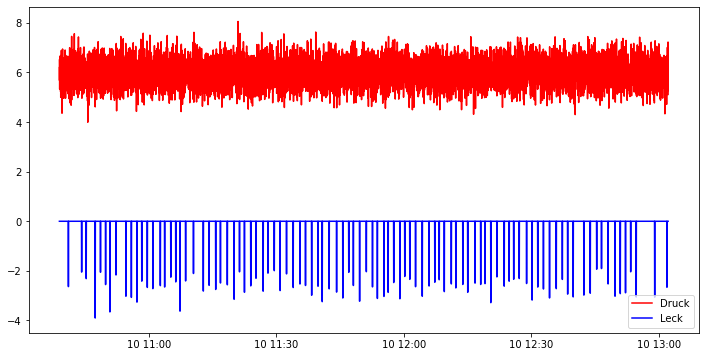

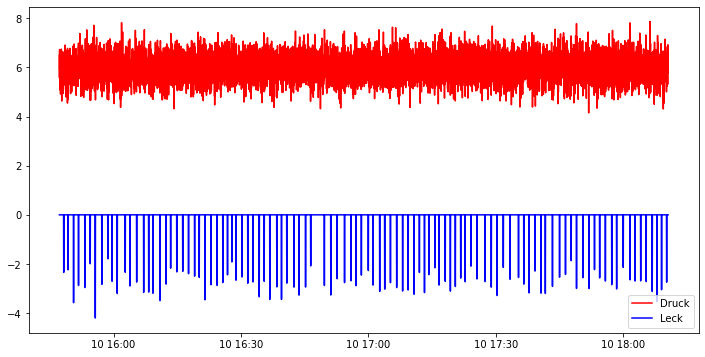

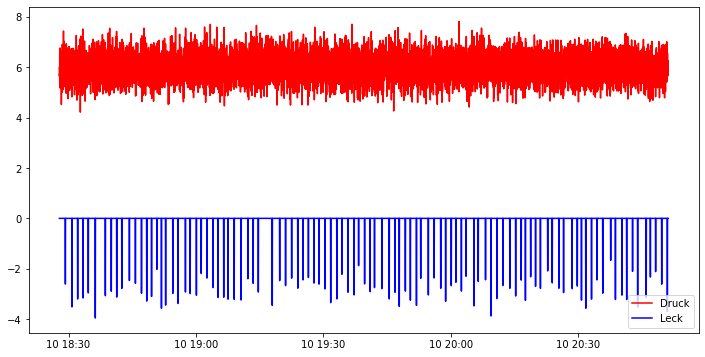

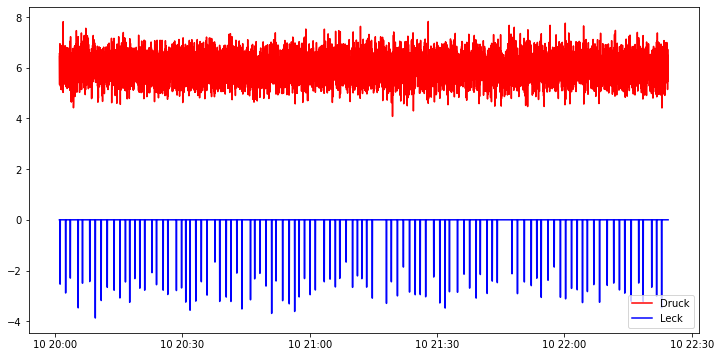

In [22]:
for i in leck_short:
    if (i < 1000):
        fig, ax = plt.subplots(figsize=(12,6))
        ax.plot(df.time[i: i + 8000], df.druck[i: i + 8000], color='red', label='Druck')
        ax.plot(df.time[i: i + 8000], df.leck[i: i + 8000], color='blue', label='Leck')

        plt.legend(loc=4)

    else:    
        fig, ax = plt.subplots(figsize=(12,6))
        ax.plot(df.time[i - 500: i + 8000], df.druck[i - 500: i + 8000], color='red', label='Druck')
        ax.plot(df.time[i - 500: i + 8000], df.leck[i - 500: i + 8000], color='blue', label='Leck')

        plt.legend(loc=4)

In [ ]:
for i in druck_short:
    if (i < 300):
        fig, ax = plt.subplots(figsize=(16,6))
        ax.plot(df.time[i: i + 300], df.druck[i: i + 300], color='red', label='Druck')
        ax.plot(df.time[i: i + 300], df.leck[i: i + 300], color='blue', label='Leck')

        plt.legend(loc=4)

    else:    
        fig, ax = plt.subplots(figsize=(16,6))
        ax.plot(df.time[i - 300: i + 300], df.druck[i - 300: i + 300], color='red', label='Druck')
        ax.plot(df.time[i - 300: i + 300], df.leck[i - 300: i + 300], color='blue', label='Leck')

        plt.legend(loc=4)

In [17]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

In [18]:
scaler = MinMaxScaler()
df_norm = df.copy()
df_norm[:] = scaler.fit_transform(df_norm)

TypeError: float() argument must be a string or a number, not 'Timestamp'

In [19]:
dbscan = DBSCAN(eps=0.14, min_samples=5)
labels = dbscan.fit_predict(df)
#df_pca['label_DBSCAN'] = labels

TypeError: float() argument must be a string or a number, not 'Timestamp'

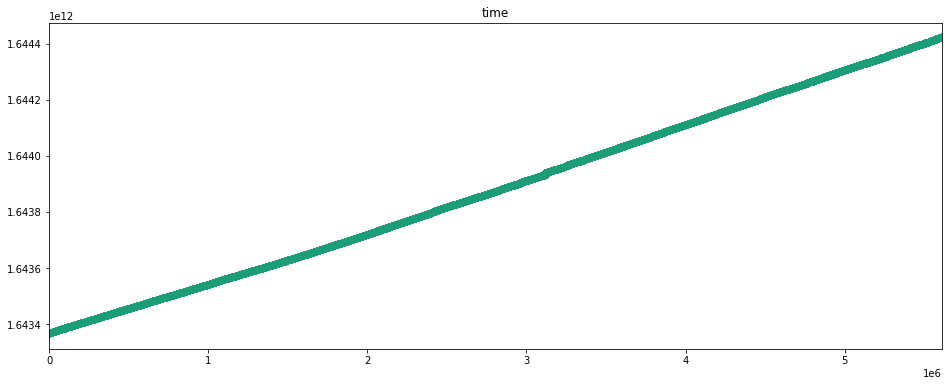

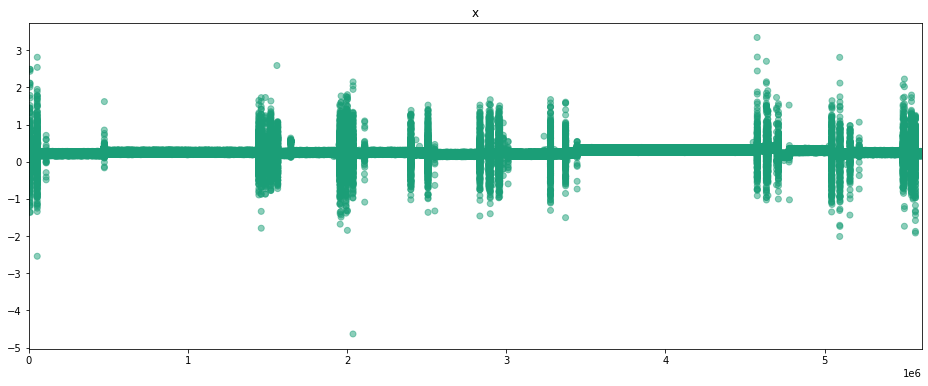

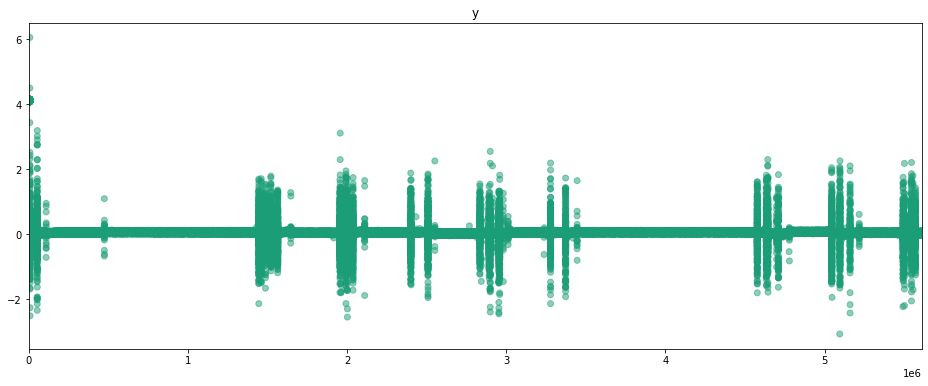

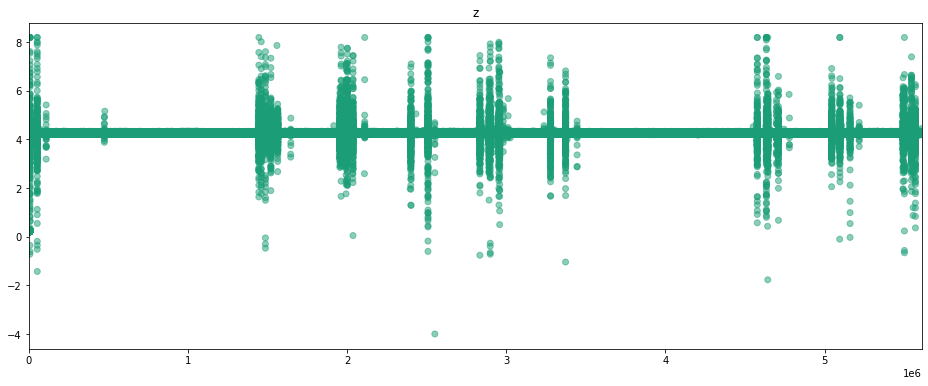

In [ ]:
fig, ax = plt.subplots(figsize=(16, 6))
plt.scatter(df.index, df['x'], c=labels, alpha=0.5, cmap=plt.get_cmap('Dark2'))
plt.xlim([df.index[0], df.index[-1]])
plt.title('X')